In [3]:
import numpy as np

import pandas as pd

#import altair as alt

import matplotlib
import matplotlib.pyplot as plt

import bokeh
import bokeh.plotting
from bokeh.plotting import ColumnDataSource
from bokeh.models import LabelSet
import bokeh.io
bokeh.io.output_notebook()

Loading BokehJS ...

In [4]:
df1 = pd.read_csv('190505_DCHC_Transfer_SP_02_well_1DeepCut_resnet50_DCHC_transfer_analysis_SPAug29shuffle1_200000.csv',header=[1,2])

df2 = pd.read_csv('190505_DCHC_Transfer_SP_02_well_2DeepCut_resnet50_DCHC_transfer_analysis_SPAug29shuffle1_200000.csv',header=[1,2])

df3 = pd.read_csv('190505_DCHC_Transfer_SP_02_well_3DeepCut_resnet50_DCHC_transfer_analysis_SPAug29shuffle1_200000.csv',header=[1,2])

df6 = pd.read_csv('190505_DCHC_Transfer_SP_02_well_6DeepCut_resnet50_DCHC_transfer_analysis_SPAug29shuffle1_200000.csv',header=[1,2])

df7 = pd.read_csv('190505_DCHC_Transfer_SP_02_well_7DeepCut_resnet50_DCHC_transfer_analysis_SPAug29shuffle1_200000.csv',header=[1,2])

In [5]:
df1['antlength'] = np.sqrt((df1['anthead']['x'] - df1['antgaster']['x'])**2 + 
                           (df1['anthead']['y'] - df1['antgaster']['y'])**2)

df2['antlength'] = np.sqrt((df2['anthead']['x'] - df2['antgaster']['x'])**2 + 
                           (df2['anthead']['y'] - df2['antgaster']['y'])**2)

df3['antlength'] = np.sqrt((df3['anthead']['x'] - df3['antgaster']['x'])**2 + 
                           (df3['anthead']['y'] - df3['antgaster']['y'])**2)

df6['antlength'] = np.sqrt((df6['anthead']['x'] - df6['antgaster']['x'])**2 + 
                           (df6['anthead']['y'] - df6['antgaster']['y'])**2)

df7['antlength'] = np.sqrt((df7['anthead']['x'] - df7['antgaster']['x'])**2 + 
                           (df7['anthead']['y'] - df7['antgaster']['y'])**2)

In [6]:
df_list = [df1,
           df2,
           df3,
           df6,
           df7]

bars = [[100,30],
        [100,30],
        [110,40],
        [110,40],
        [80,20]]

In [7]:
plots = []
for i,df in enumerate(df_list):

    p = bokeh.plotting.figure(plot_width=600,
                          plot_height=400,
                          x_axis_label='time, s',
                          y_axis_label='length, pixels')


    p.circle(df['bodyparts']['coords'],df['antlength'],
         color='Blue',legend='ant length',alpha=0.1)

    p.line([0,80000],[bars[i][0],bars[i][0]],line_width=5,color='red')
    p.line([0,80000],[bars[i][1],bars[i][1]],line_width=5,color='red')
    
    plots.append(p)
bokeh.io.show(bokeh.layouts.column(plots))

In [8]:
for i,df in enumerate(df_list):
    df['good frames'] = (df['antlength'] < bars[i][0]) & (df['antlength'] > bars[i][1])   

In [9]:
for i,df in enumerate(df_list):
    avgLen = np.average(df['antlength'].loc[df['good frames']])
    df['touching'] = False

    df['head2head'] = np.sqrt((df['beetlehead']['x'] - df['anthead']['x'])**2 + 
                              (df['beetlehead']['y'] - df['anthead']['y'])**2)
        
    df['head2butt'] = np.sqrt((df['beetlehead']['x'] - df['antgaster']['x'])**2 + 
                              (df['beetlehead']['y'] - df['antgaster']['y'])**2)
    
    
    df['ellipse distance'] = df['head2head'] + df['head2butt']
    df['touching'] = ((df['antlength']*1.4 > df['ellipse distance'])*df['good frames']) | ((df['head2head']<avgLen) | (df['head2butt']<avgLen))

/Users/TomNaragon/anaconda3/envs/mainEnv/lib/python3.7/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))


In [10]:
p = bokeh.plotting.figure(plot_width=600,
                          plot_height=400,
                          x_axis_label='time, s',
                          y_axis_label='length, pixels')


p.circle(df['bodyparts']['coords'],df['ellipse distance'],
         color='Blue',legend='elipse distance',alpha=0.1)

p.line((df['bodyparts']['coords']).loc[df['good frames']],df['antlength'].loc[df['good frames']]*1.4,color='red')

bokeh.io.show(p)

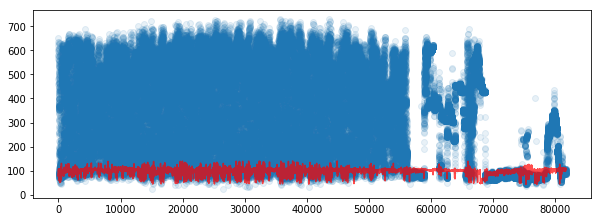

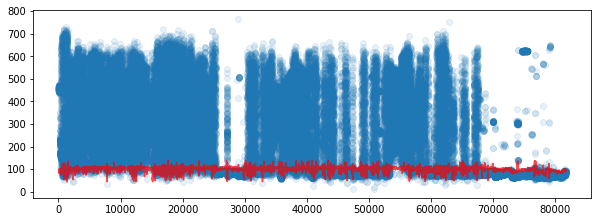

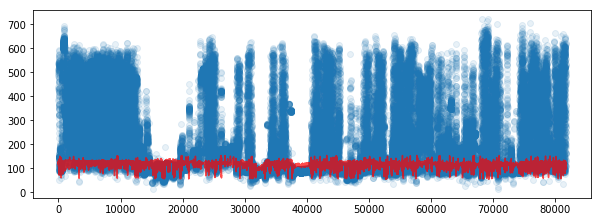

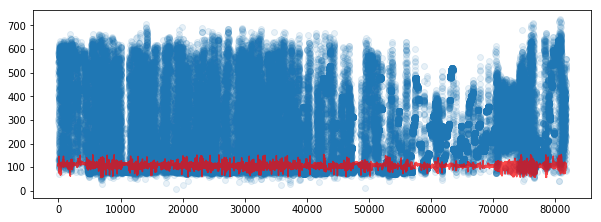

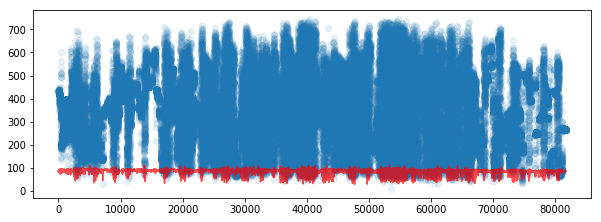

In [11]:
for i,df in enumerate(df_list):
    subplt = int('51' + str(i+1))
    plt.figure(figsize=(10,20))
    plt.subplot(subplt)
    plt.scatter(df['bodyparts']['coords'],df['ellipse distance'],alpha=0.1)
    plt.plot((df['bodyparts']['coords']).loc[df['good frames']],df['antlength'].loc[df['good frames']]*1.4,color='red',alpha=0.7)

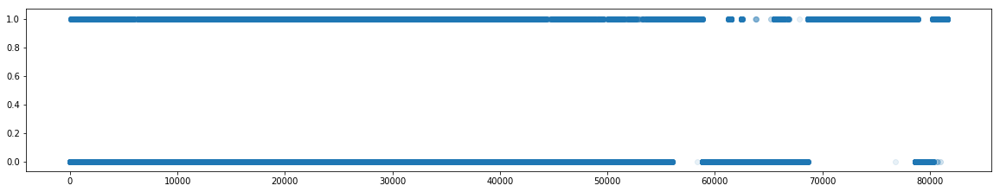

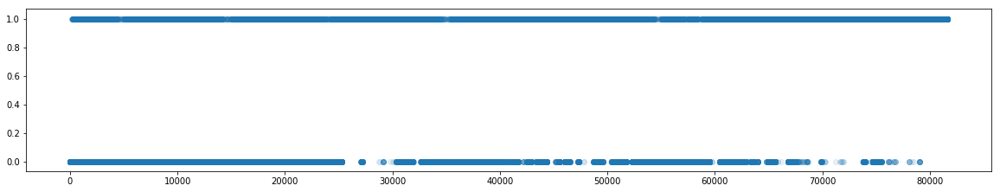

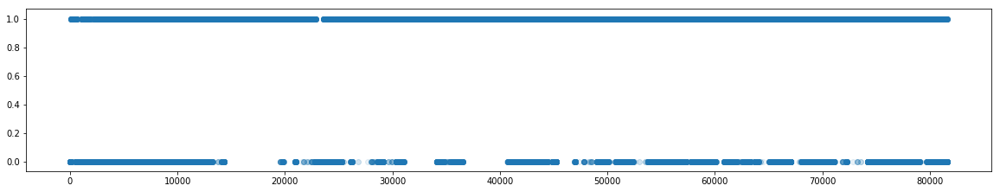

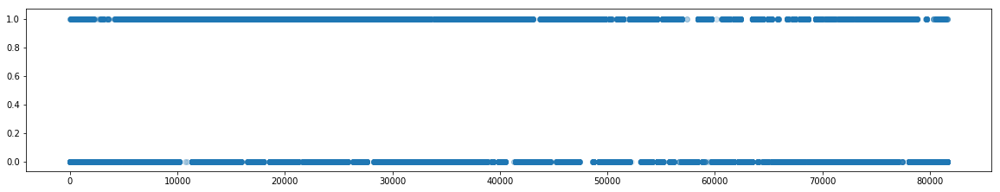

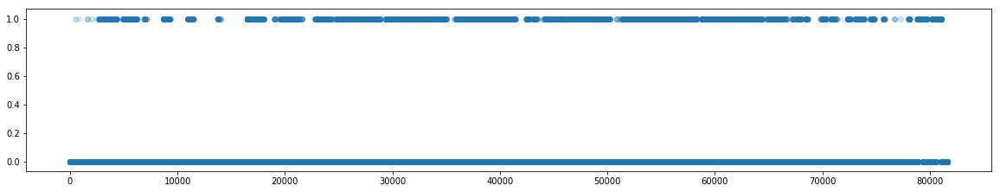

In [12]:
for i,df in enumerate(df_list):
    subplt = int('51' + str(i+1))
    plt.figure(figsize=(20,20))
    plt.subplot(subplt)
    plt.scatter(df['bodyparts']['coords'],df['touching'],alpha=0.1)

In [13]:
contact_time=[]
for i,df in enumerate(df_list):
    contact_time.append(sum(df['touching'])/len(df))

In [14]:
contact_time

[0.3613203502970176,
 0.5187090452569049,
 0.6402841570212505,
 0.4064792700104109,
 0.12009308592075449]

In [15]:
def ecdf_func(x):
    return np.sort(x), np.arange(len(x))/len(x)

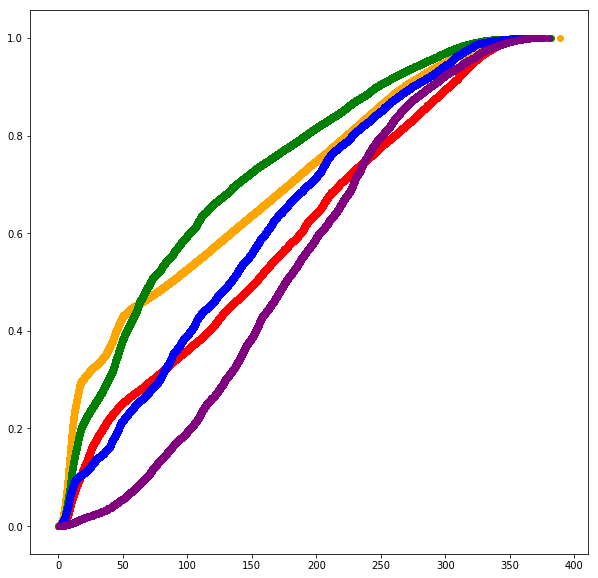

In [16]:
p = bokeh.plotting.figure(plot_width=600,
                          plot_height=400,
                          x_axis_label='distance',
                          y_axis_label='ECDF')

colors=['Red','Orange','Green','Blue','Purple']
plt.figure(figsize=(10,10))
for i,df in enumerate(df_list):
    x_val,y_val=ecdf_func(df['head2head'])
    
    plt.scatter(x_val,y_val,color=colors[i])